In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
outcomes = pd.read_csv('outcomes.csv/outcomes.csv')
donations = pd.read_csv('donations.csv/donations.csv')
projects = pd.read_csv('projects.csv/projects.csv')
resources = pd.read_csv('resources.csv/resources.csv')
essays = pd.read_csv('essays.csv/essays.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'outcomes.csv/outcomes.csv'

In [3]:
# dfs = {'Outcomes': outcomes, 'Donations': donations, 'Projects': projects, 'Essays': essays, 'Resources': resources}
# summary = []

# for name, df in dfs.items():
#     for col in df.columns:
#         data_type = df[col].dtype
#         summary.append((name, col, data_type))

# summary_df = pd.DataFrame(summary, columns=['Dataframe', 'Column', 'Data Type'])
# pd.set_option('display.max_rows', None)
# summary_df

In [4]:
donations.isnull().sum()

donationid                                        0
projectid                                         0
donor_acctid                                      0
donor_city                                  2005643
donor_state                                  603109
donor_zip                                   1712062
is_teacher_acct                                   0
donation_timestamp                                0
donation_to_project                               0
donation_optional_support                         0
donation_total                                    0
dollar_amount                                     0
donation_included_optional_support                0
payment_method                                    0
payment_included_acct_credit                      0
payment_included_campaign_gift_card               0
payment_included_web_purchased_gift_card          0
payment_was_promo_matched                         0
via_giving_page                                   0
for_honoree 

In [5]:
donations_cleaned = donations.dropna(subset=['donor_city', 'donor_state', 'donor_zip'])
donations_cleaned.isnull().sum()

donationid                                       0
projectid                                        0
donor_acctid                                     0
donor_city                                       0
donor_state                                      0
donor_zip                                        0
is_teacher_acct                                  0
donation_timestamp                               0
donation_to_project                              0
donation_optional_support                        0
donation_total                                   0
dollar_amount                                    0
donation_included_optional_support               0
payment_method                                   0
payment_included_acct_credit                     0
payment_included_campaign_gift_card              0
payment_included_web_purchased_gift_card         0
payment_was_promo_matched                        0
via_giving_page                                  0
for_honoree                    

In [6]:
merged = pd.merge(donations_cleaned, projects, on='projectid', how='inner')
# merged = pd.merge(merged, projects, on='projectid', how='inner')
merged.head()

,donationid,projectid,donor_acctid,donor_city,donor_state,donor_zip,is_teacher_acct,donation_timestamp,donation_to_project,donation_optional_support,...,resource_type,poverty_level,grade_level,fulfillment_labor_materials,total_price_excluding_optional_support,total_price_including_optional_support,students_reached,eligible_double_your_impact_match,eligible_almost_home_match,date_posted
0,431d720bc3dfd75ae445a5eaa0b0638d,ffffac55ee02a49d1abc87ba6fc61135,22cbc920c9b5fa08dfb331422f5926b5,Peachtree City,GA,30269.0,f,2011-08-25 14:27:34.807,42.50,7.50,...,Technology,highest poverty,Grades PreK-2,35.0,207.43,244.04,8.0,f,f,2011-06-11
1,3fa95d29986aa6f401c6719ced3a3ce7,ffffac55ee02a49d1abc87ba6fc61135,1e0a63fc8141c7ba26b8b44ca0871b90,Rockville,MD,20853.0,f,2011-11-02 22:53:53.019,55.35,0.00,...,Technology,highest poverty,Grades PreK-2,35.0,207.43,244.04,8.0,f,f,2011-06-11
2,020ad6bd5e88a35741d23b5e08f8b8e8,ffffac55ee02a49d1abc87ba6fc61135,1d4acb508df29d5f1cc6d382969576cb,Salem,IN,47167.0,f,2011-11-03 23:54:01.109,8.50,1.50,...,Technology,highest poverty,Grades PreK-2,35.0,207.43,244.04,8.0,f,f,2011-06-11
3,9e0f234dfa2982619dacd0635019d53d,ffff2d9c769c8fb5335e949c615425eb,af1f03b856fc2979c01a6ad8b61f6fbe,Pocatello,ID,83201.0,f,2013-05-08 12:58:55.38,68.00,12.00,...,Technology,high poverty,Grades 3-5,30.0,579.74,682.05,25.0,f,f,2013-03-03
4,fdcd840e3dd57016590cb8a69aed0c09,ffff2d9c769c8fb5335e949c615425eb,af1f03b856fc2979c01a6ad8b61f6fbe,Pocatello,ID,83201.0,f,2013-05-08 13:18:21.233,12.75,2.25,...,Technology,high poverty,Grades 3-5,30.0,579.74,682.05,25.0,f,f,2013-03-03


In [7]:
pd.set_option('display.max_rows', None)
merged.columns

Index(['donationid', 'projectid', 'donor_acctid', 'donor_city', 'donor_state',
       'donor_zip', 'is_teacher_acct', 'donation_timestamp',
       'donation_to_project', 'donation_optional_support', 'donation_total',
       'dollar_amount', 'donation_included_optional_support', 'payment_method',
       'payment_included_acct_credit', 'payment_included_campaign_gift_card',
       'payment_included_web_purchased_gift_card', 'payment_was_promo_matched',
       'via_giving_page', 'for_honoree', 'donation_message', 'teacher_acctid',
       'schoolid', 'school_ncesid', 'school_latitude', 'school_longitude',
       'school_city', 'school_state', 'school_zip', 'school_metro',
       'school_district', 'school_county', 'school_charter', 'school_magnet',
       'school_year_round', 'school_nlns', 'school_kipp',
       'school_charter_ready_promise', 'teacher_prefix',
       'teacher_teach_for_america', 'teacher_ny_teaching_fellow',
       'primary_focus_subject', 'primary_focus_area',
       'se

In [8]:
merged = merged[['donationid', 'projectid', 'donor_city', 'donor_state', 'donor_zip', 
                 'school_latitude', 'school_longitude', 'school_city', 'school_state', 
                 'school_zip', 'school_metro', 'school_district', 'donation_total', 'primary_focus_subject',
                 'primary_focus_area', 'students_reached']]
merged.head()

,donationid,projectid,donor_city,donor_state,donor_zip,school_latitude,school_longitude,school_city,school_state,school_zip,school_metro,school_district,donation_total,primary_focus_subject,primary_focus_area,students_reached
0,431d720bc3dfd75ae445a5eaa0b0638d,ffffac55ee02a49d1abc87ba6fc61135,Peachtree City,GA,30269.0,33.514296,-84.345336,Jonesboro,GA,30236.0,suburban,Clayton Co Public Schools,50.00,Special Needs,Special Needs,8.0
1,3fa95d29986aa6f401c6719ced3a3ce7,ffffac55ee02a49d1abc87ba6fc61135,Rockville,MD,20853.0,33.514296,-84.345336,Jonesboro,GA,30236.0,suburban,Clayton Co Public Schools,55.35,Special Needs,Special Needs,8.0
2,020ad6bd5e88a35741d23b5e08f8b8e8,ffffac55ee02a49d1abc87ba6fc61135,Salem,IN,47167.0,33.514296,-84.345336,Jonesboro,GA,30236.0,suburban,Clayton Co Public Schools,10.00,Special Needs,Special Needs,8.0
3,9e0f234dfa2982619dacd0635019d53d,ffff2d9c769c8fb5335e949c615425eb,Pocatello,ID,83201.0,42.820593,-112.409161,Pocatello,ID,83204.0,urban,Pocatello-Chubbuck District 25,80.00,Mathematics,Math & Science,25.0
4,fdcd840e3dd57016590cb8a69aed0c09,ffff2d9c769c8fb5335e949c615425eb,Pocatello,ID,83201.0,42.820593,-112.409161,Pocatello,ID,83204.0,urban,Pocatello-Chubbuck District 25,15.00,Mathematics,Math & Science,25.0


In [9]:
grouped_data = merged.groupby(['donor_state', 'primary_focus_subject']).agg({'donation_total': 'sum'}).reset_index()
grouped_data.head()

,donor_state,primary_focus_subject,donation_total
0,,Applied Sciences,706.55
1,,Character Education,92.53
2,,College & Career Prep,143.76
3,,Community Service,50.00
4,,ESL,174.12


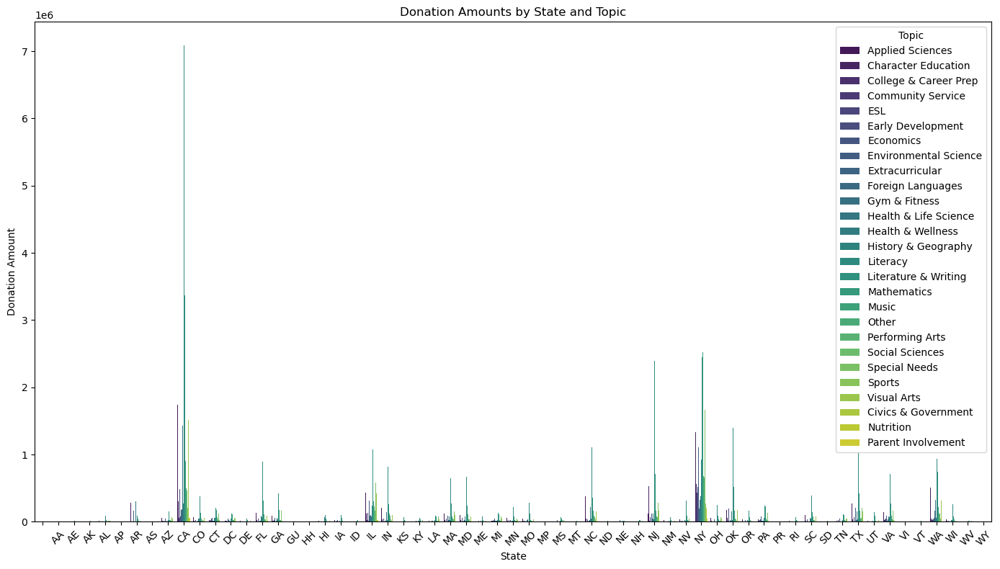

In [10]:
# Plotting with seaborn
plt.figure(figsize=(14, 8))
bar_plot = sns.barplot(x='donor_state', y='donation_total', hue='primary_focus_subject', data=grouped_data, palette='viridis')
bar_plot.set_title('Donation Amounts by State and Topic')
plt.xticks(rotation=45)
plt.xlabel('State')
plt.ylabel('Donation Amount')
plt.legend(title='Topic')
plt.tight_layout()
plt.show()


In [11]:
import plotly.express as px

# Create an interactive bar plot
fig = px.bar(grouped_data, x='donor_state', y='donation_total', color='primary_focus_subject',
             title='Donation Amounts by State and Topic',
             labels={'donor_state': 'State', 'donation_total': 'Donation Amount'},
             color_discrete_sequence=px.colors.sequential.Viridis)

fig.update_layout(xaxis_title='State', yaxis_title='Donation Amount', xaxis_tickangle=-45)
fig.show()


c:\Users\shambhavi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


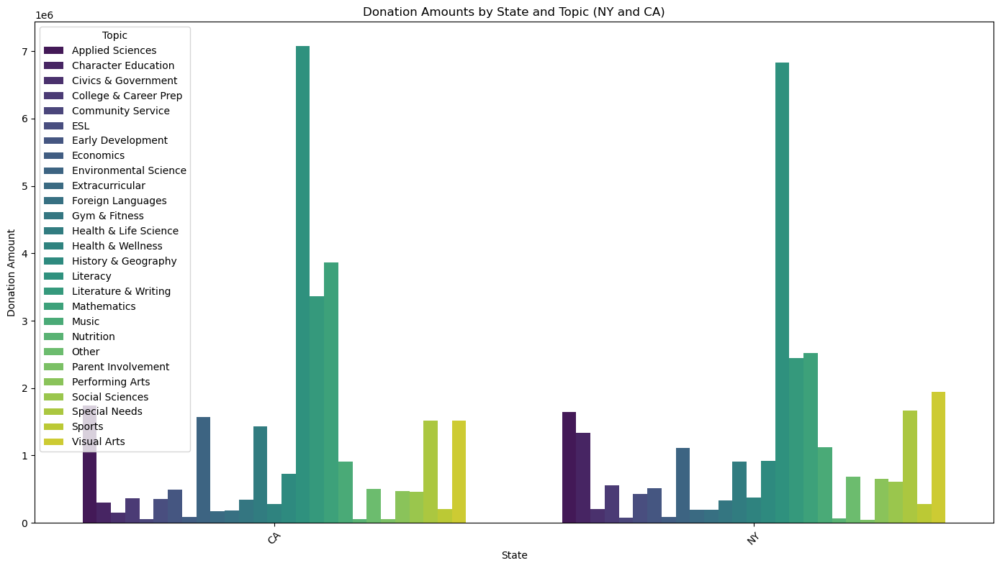

In [12]:
filtered_data = grouped_data[grouped_data['donor_state'].isin(['NY', 'CA'])]
plt.figure(figsize=(14, 8))
bar_plot = sns.barplot(x='donor_state', y='donation_total', hue='primary_focus_subject', data=filtered_data, palette='viridis')
bar_plot.set_title('Donation Amounts by State and Topic (NY and CA)')
plt.xticks(rotation=45)
plt.xlabel('State')
plt.ylabel('Donation Amount')
plt.legend(title='Topic')
plt.tight_layout()
plt.show()

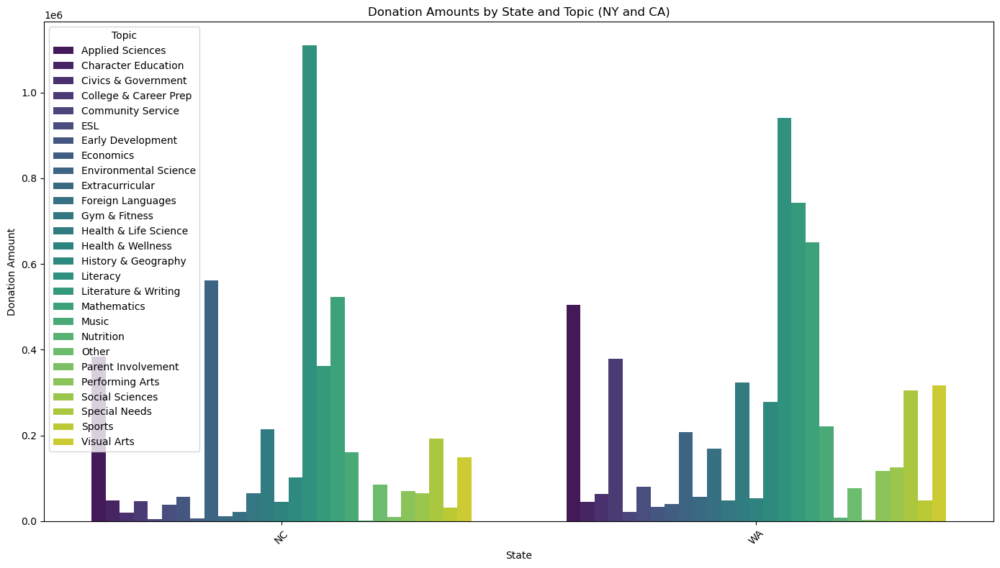

In [13]:
filtered_data = grouped_data[grouped_data['donor_state'].isin(['WA', 'NC'])]
plt.figure(figsize=(14, 8))
bar_plot = sns.barplot(x='donor_state', y='donation_total', hue='primary_focus_subject', data=filtered_data, palette='viridis')
bar_plot.set_title('Donation Amounts by State and Topic (NY and CA)')
plt.xticks(rotation=45)
plt.xlabel('State')
plt.ylabel('Donation Amount')
plt.legend(title='Topic')
plt.tight_layout()
plt.show()

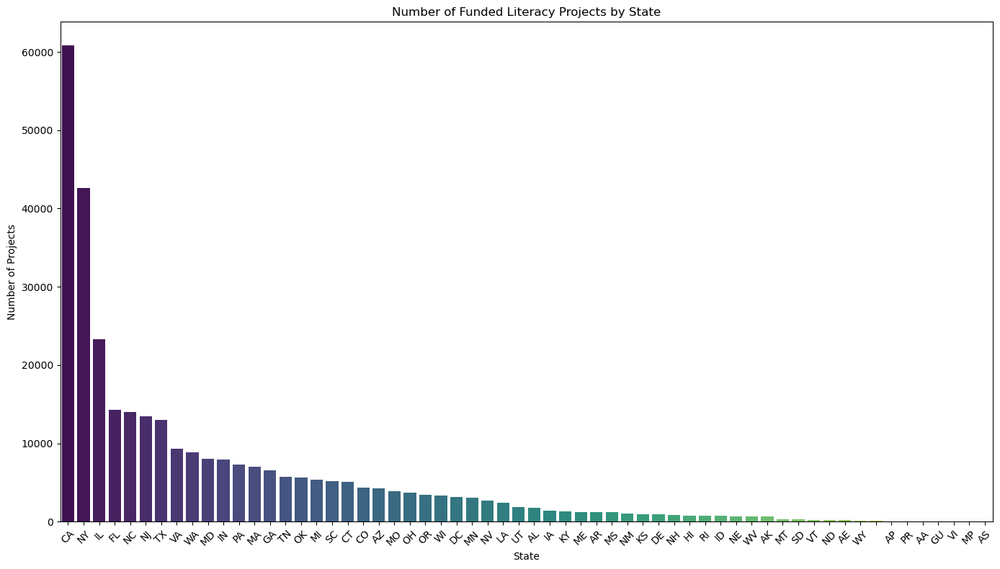

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data for Literacy projects
literacy_projects = merged[merged['primary_focus_subject'] == 'Literacy']

# Group by state and count the number of projects
grouped_literacy_projects = literacy_projects.groupby('donor_state').size().reset_index(name='num_projects')

# Sort by number of projects for better visualization
grouped_literacy_projects = grouped_literacy_projects.sort_values(by='num_projects', ascending=False)

# Create the bar plot
plt.figure(figsize=(14, 8))
bar_plot = sns.barplot(x='donor_state', y='num_projects', data=grouped_literacy_projects, palette='viridis')
bar_plot.set_title('Number of Funded Literacy Projects by State')
plt.xticks(rotation=45)
plt.xlabel('State')
plt.ylabel('Number of Projects')
plt.tight_layout()
plt.show()


In [15]:
merged['primary_focus_area'].unique()

array(['Special Needs', 'Math & Science', 'Literacy & Language',
       'Music & The Arts', 'Applied Learning', 'History & Civics',
       'Health & Sports', nan], dtype=object)

In [16]:
projects.columns

Index(['projectid', 'teacher_acctid', 'schoolid', 'school_ncesid',
       'school_latitude', 'school_longitude', 'school_city', 'school_state',
       'school_zip', 'school_metro', 'school_district', 'school_county',
       'school_charter', 'school_magnet', 'school_year_round', 'school_nlns',
       'school_kipp', 'school_charter_ready_promise', 'teacher_prefix',
       'teacher_teach_for_america', 'teacher_ny_teaching_fellow',
       'primary_focus_subject', 'primary_focus_area',
       'secondary_focus_subject', 'secondary_focus_area', 'resource_type',
       'poverty_level', 'grade_level', 'fulfillment_labor_materials',
       'total_price_excluding_optional_support',
       'total_price_including_optional_support', 'students_reached',
       'eligible_double_your_impact_match', 'eligible_almost_home_match',
       'date_posted'],
      dtype='object')

In [17]:
merged['primary_focus_area'].unique()

array(['Special Needs', 'Math & Science', 'Literacy & Language',
       'Music & The Arts', 'Applied Learning', 'History & Civics',
       'Health & Sports', nan], dtype=object)

In [18]:
import pandas as pd

# Get unique primary focus areas
subject_areas = merged['primary_focus_area'].unique()

# Initialize a dictionary to store results
donation_per_state = {}

# Loop through each subject area
for subject in subject_areas:
    # Filter data for the current subject area
    subject_data = merged[merged['primary_focus_area'] == subject]
    
    # Group by state and sum the donation totals
    donations_by_state = subject_data.groupby('donor_state')['donation_total'].sum().reset_index()
    
    # Store the result in the dictionary with the subject as the key
    donation_per_state[subject] = donations_by_state

    # Print or display the results
    print(f"Donation totals for {subject} by state:")
    print(donations_by_state)
    print("\n")


Donation totals for Special Needs by state:
   donor_state  donation_total
0                      2051.78
1           AA          369.75
2           AE         6103.07
3           AK         8663.86
4           AL        19810.08
5           AP         2676.42
6           AR        12117.76
7           AS           40.00
8           AZ        70725.78
9           CA      1520699.02
10          CO        50698.72
11          CT       119941.60
12          DC        57698.44
13          DE         9795.97
14          FL       148829.39
15          GA       161787.12
16          HI        16942.71
17          IA        21874.04
18          ID         7723.55
19          IL       584399.40
20          IN       155979.88
21          KS        10192.64
22          KY        24586.31
23          LA        79897.58
24          MA       156397.32
25          MD       126489.41
26          ME        12412.18
27          MI        78253.01
28          MN        42228.32
29          MO        5310

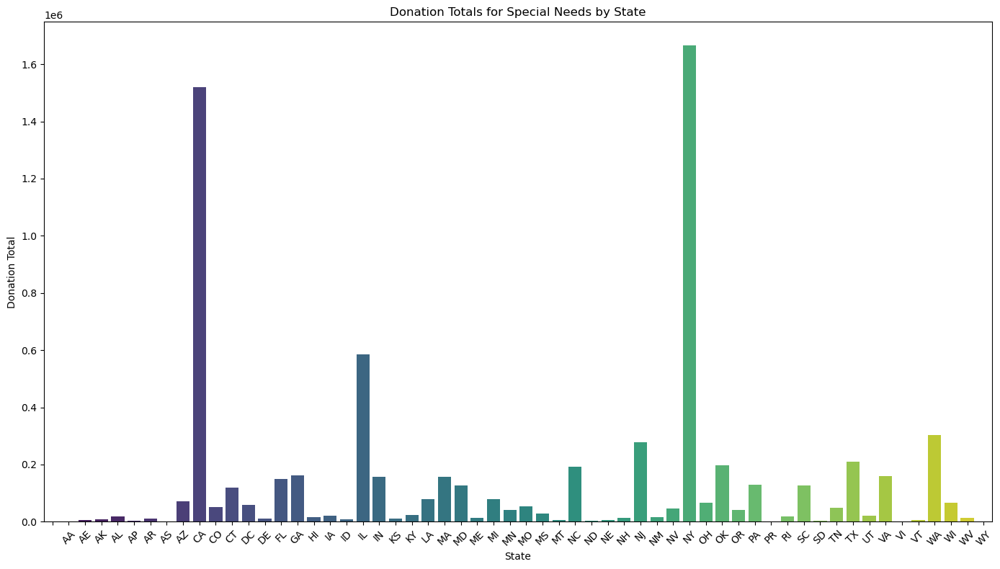

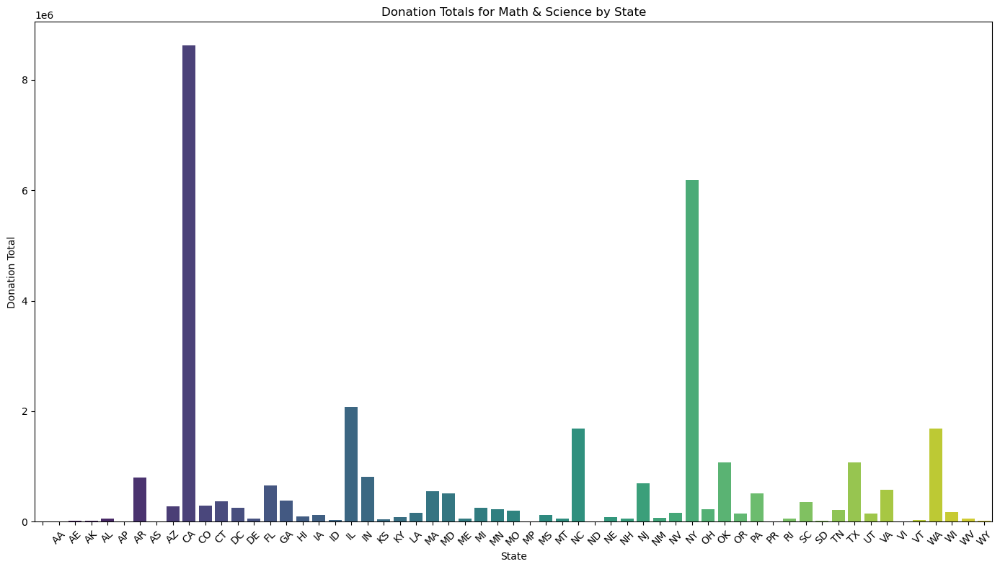

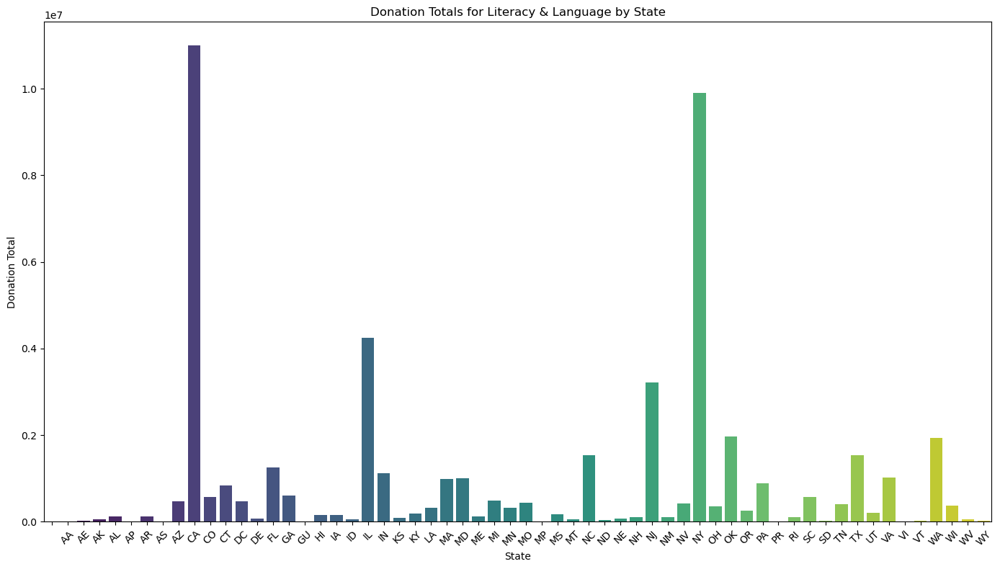

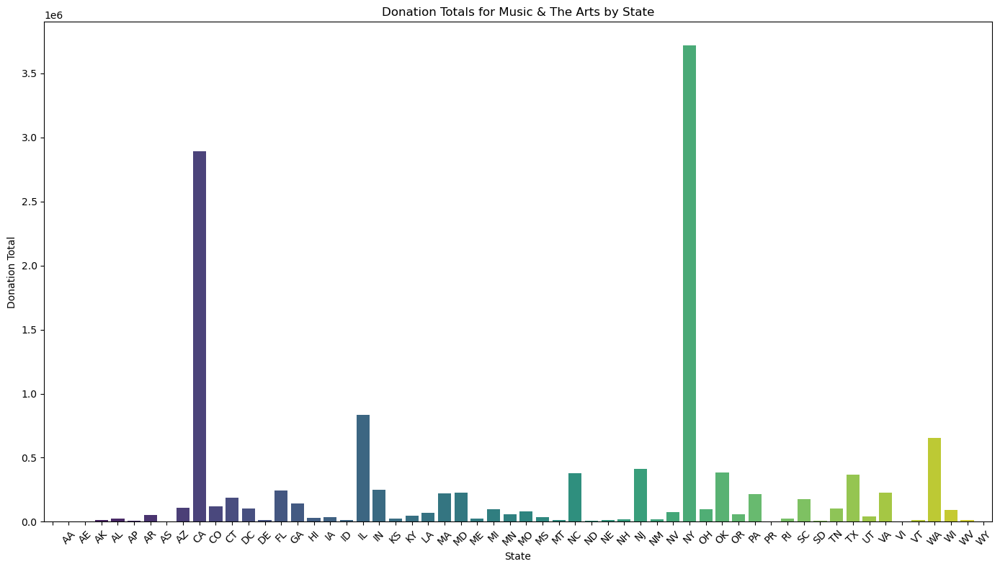

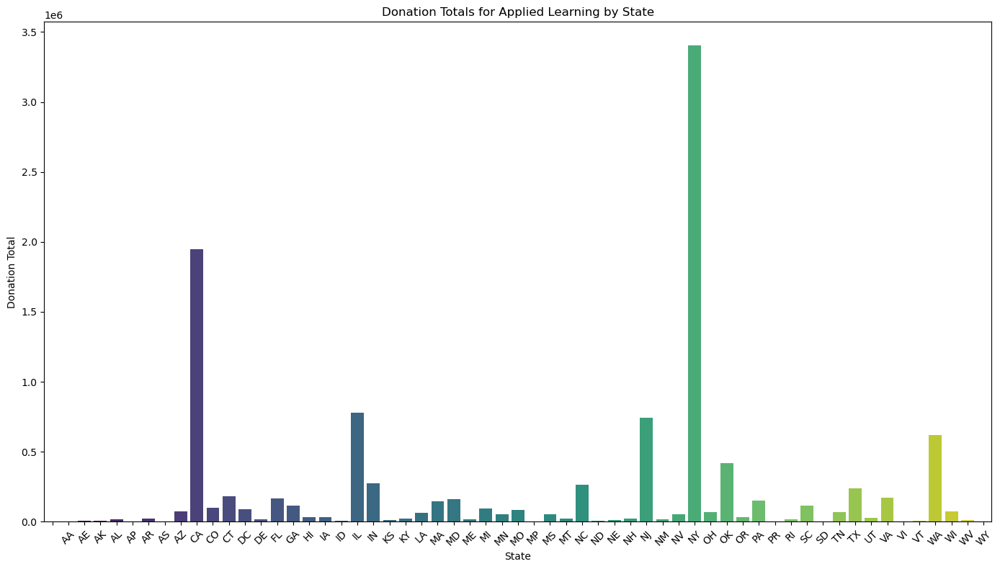

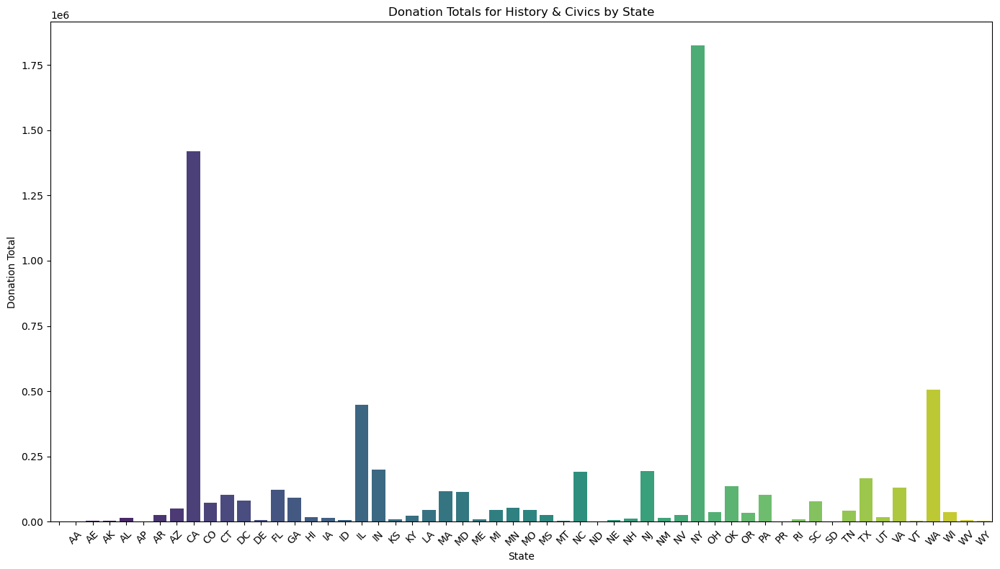

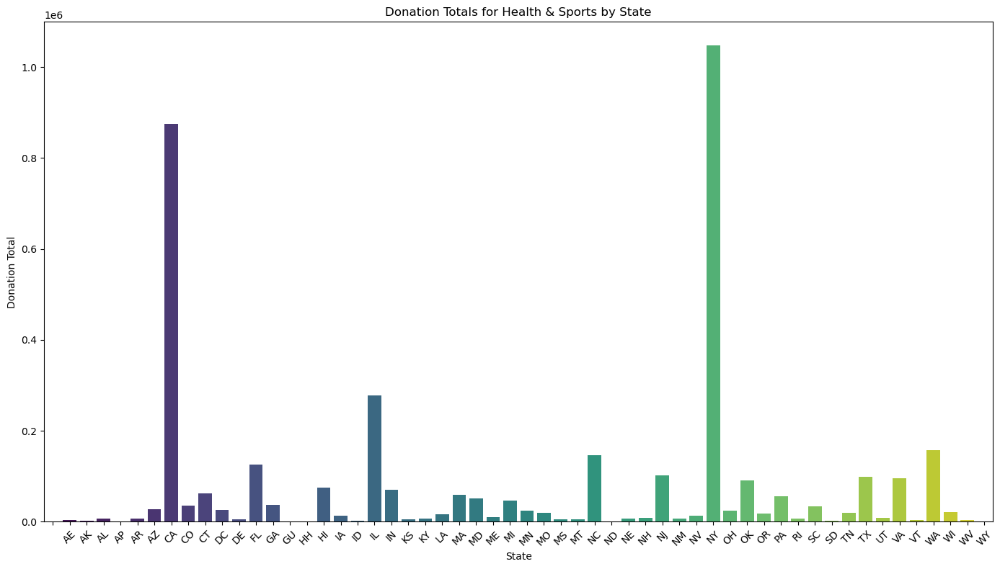

ValueError: min() arg is an empty sequence

<Figure size 1400x800 with 0 Axes>

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

for subject in subject_areas:
    subject_data = merged[merged['primary_focus_area'] == subject]
    donations_by_state = subject_data.groupby('donor_state')['donation_total'].sum().reset_index()
    
    # Plot the donation totals per state for the current subject
    plt.figure(figsize=(14, 8))
    sns.barplot(x='donor_state', y='donation_total', data=donations_by_state, palette='viridis')
    plt.title(f"Donation Totals for {subject} by State")
    plt.xticks(rotation=45)
    plt.xlabel('State')
    plt.ylabel('Donation Total')
    plt.tight_layout()
    plt.show()


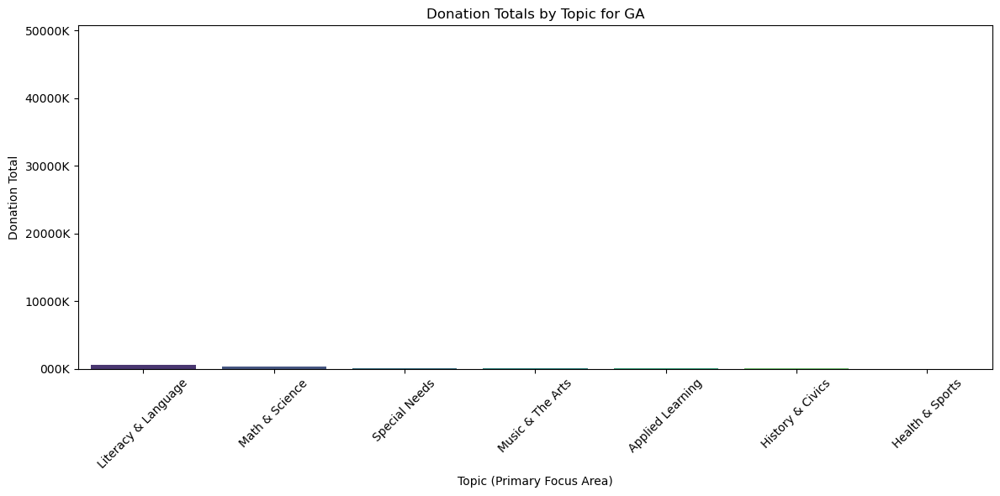

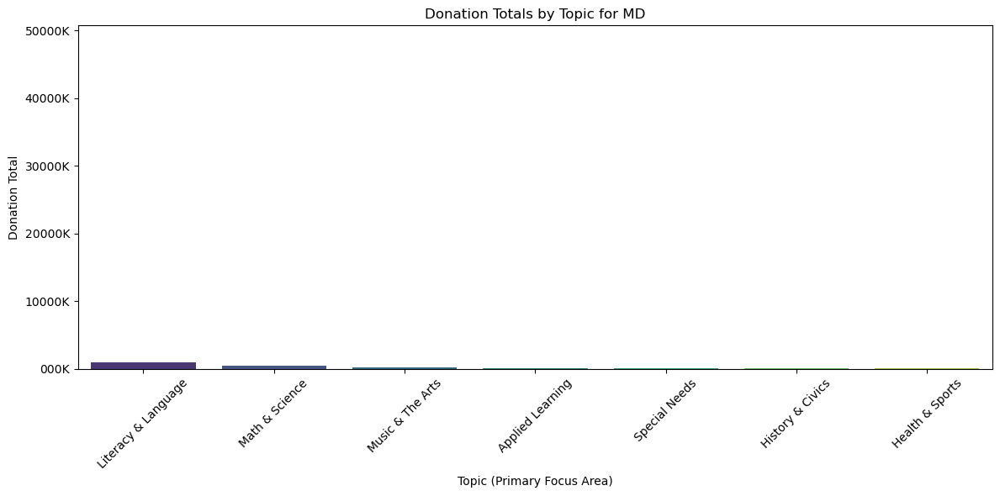

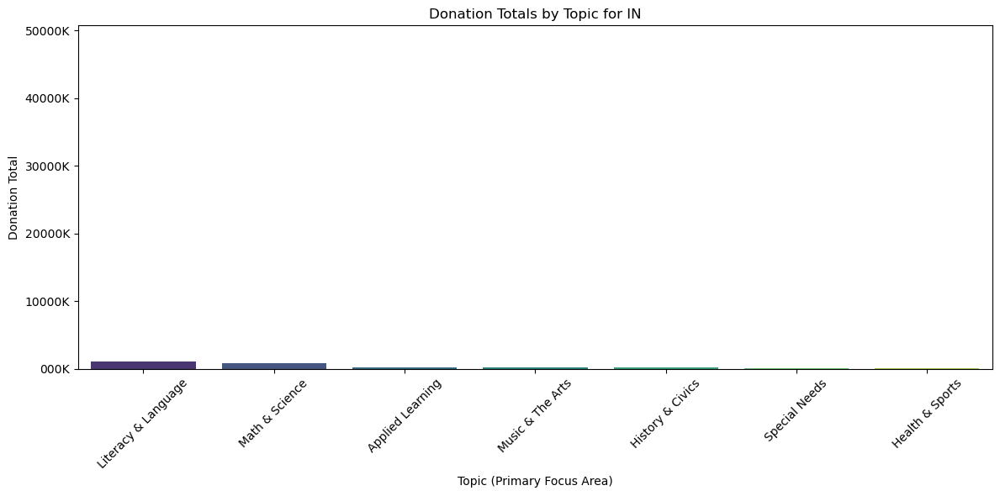

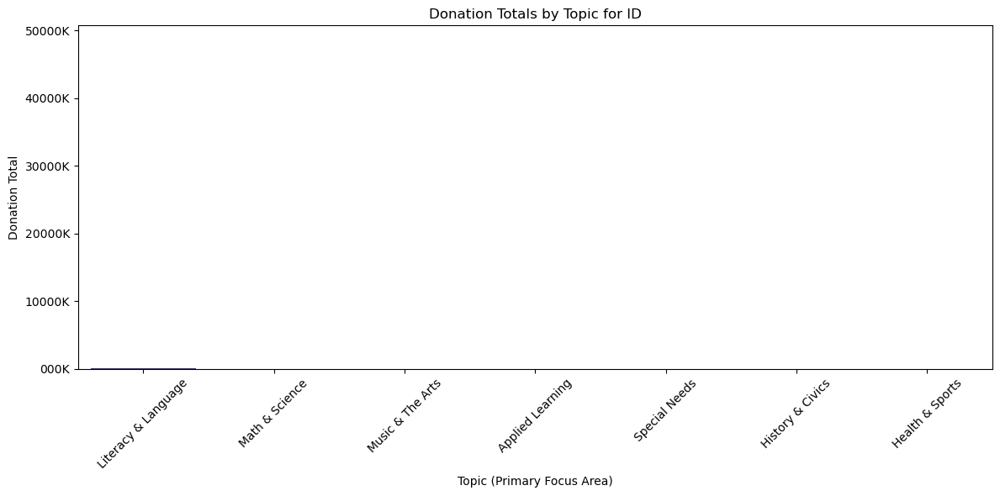

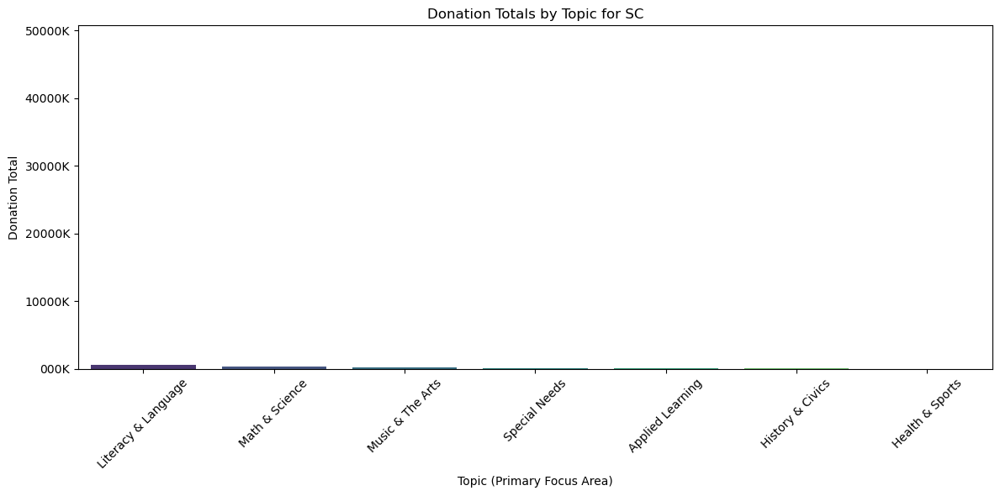

...

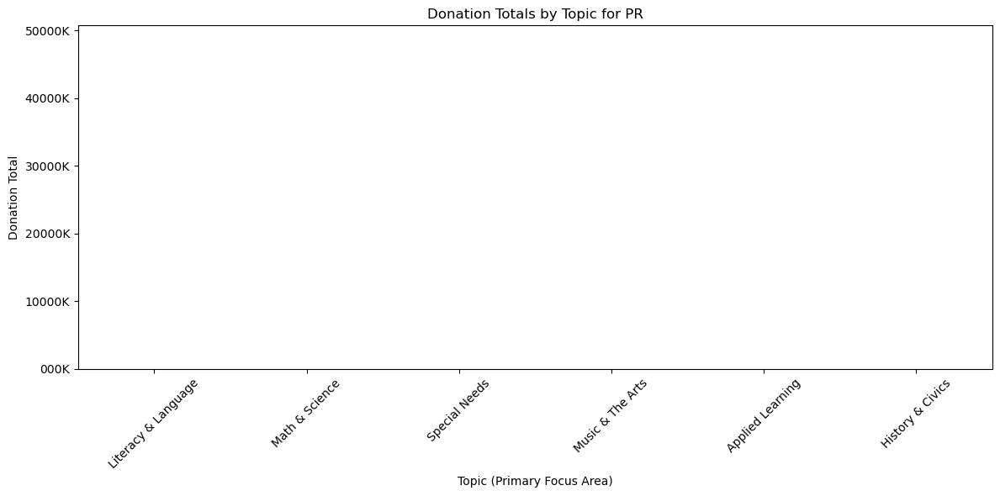

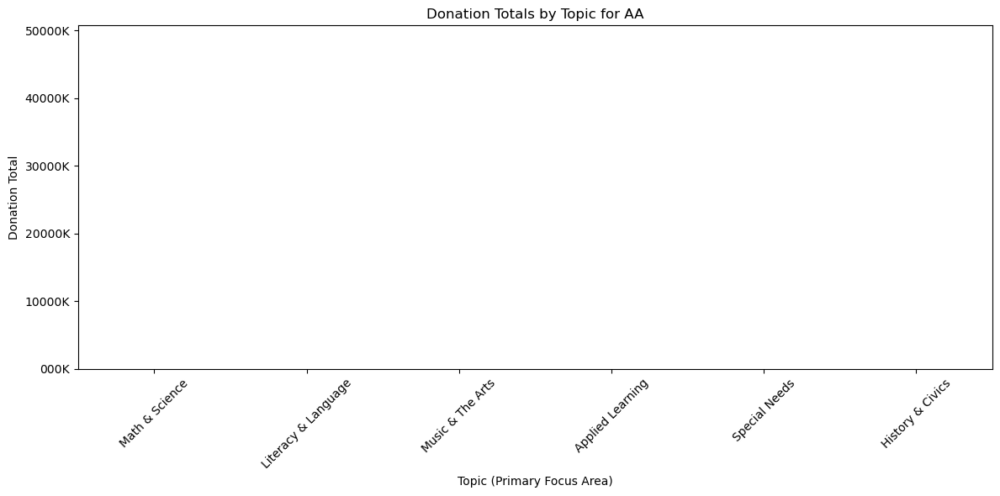

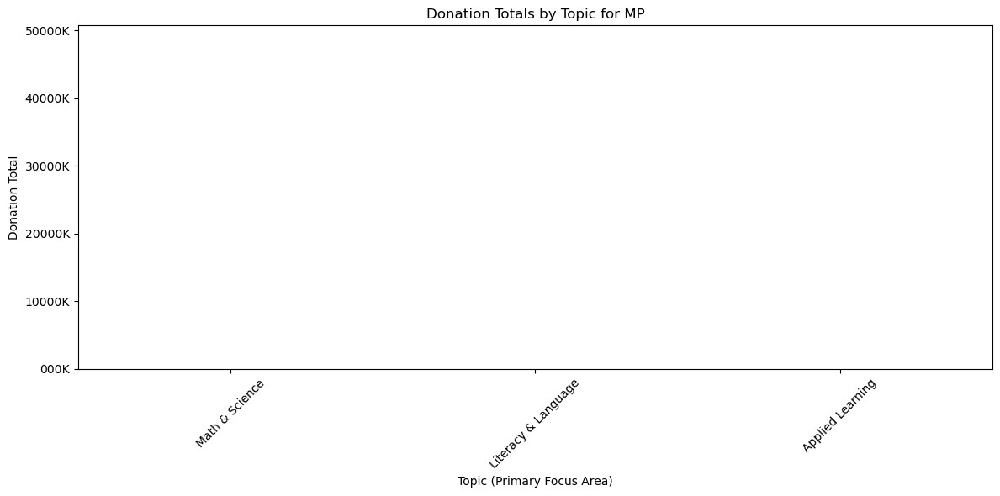

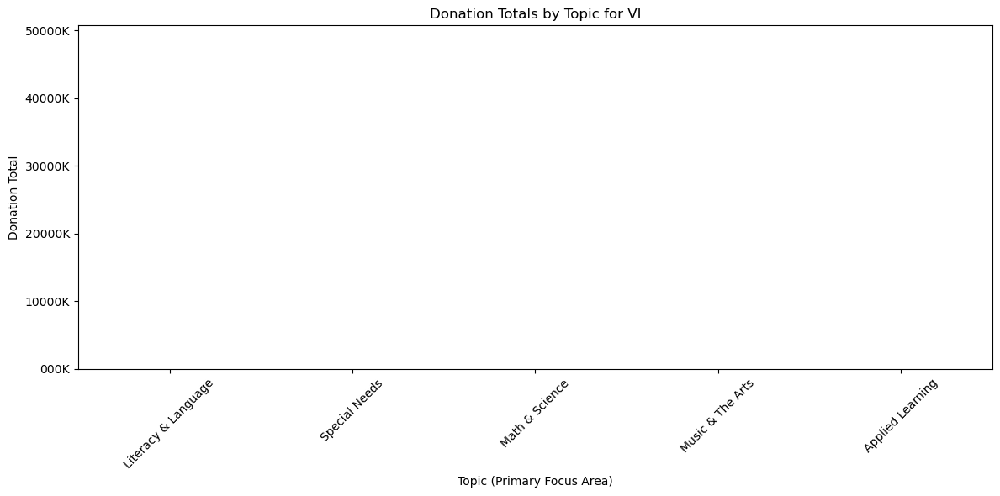

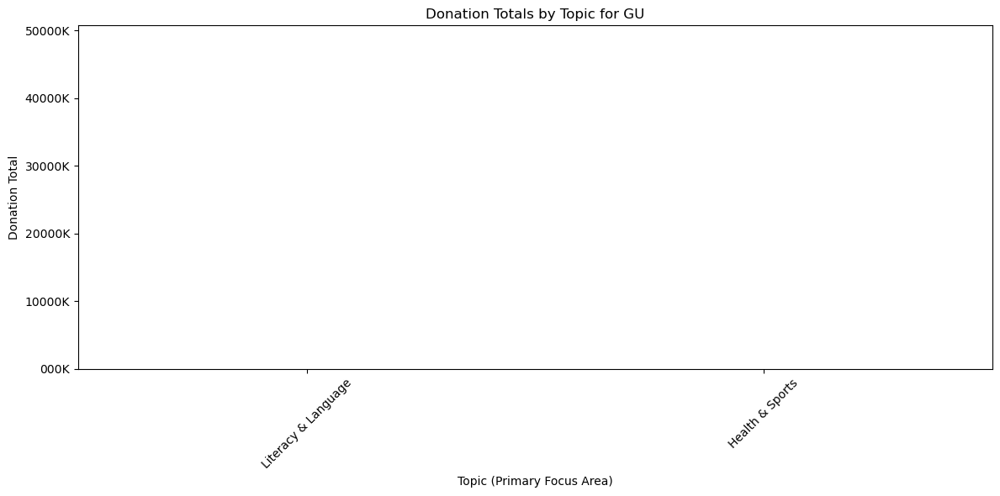

c:\Users\shambhavi\anaconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



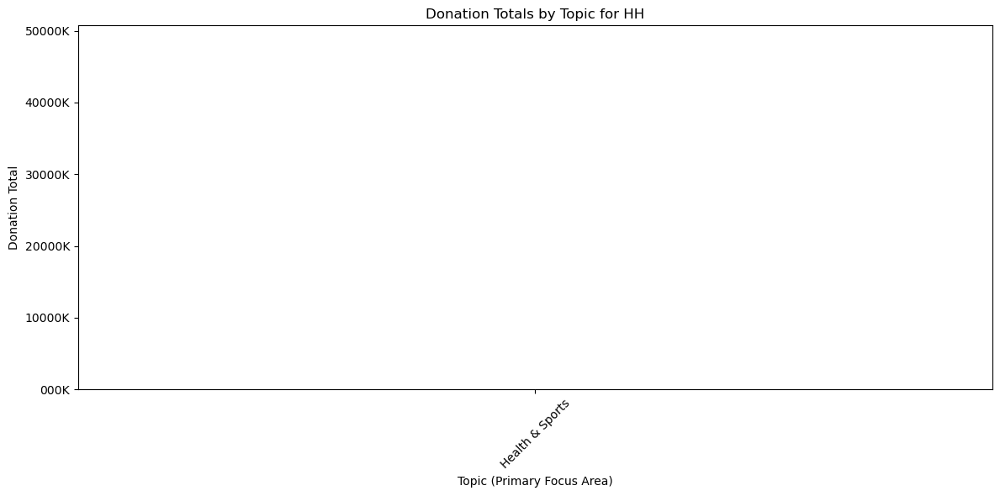

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


def format_hundreds_of_thousands(x, pos):
    return f'{int(x / 100000):,}00K'

# Get unique states
states = merged['donor_state'].unique()

# Calculate the global maximum donation total across all states for consistent y-axis
max_donation_total = merged.groupby('primary_focus_area')['donation_total'].sum().max()

# Loop through each state
for state in states:
    # Filter data for the current state
    state_data = merged[merged['donor_state'] == state]
    
    # Group by primary focus area (topic) and sum the donation totals
    donations_by_topic = state_data.groupby('primary_focus_area')['donation_total'].sum().reset_index()
    
    # Sort donations for better visualization
    donations_by_topic = donations_by_topic.sort_values(by='donation_total', ascending=False)
    
    # Create the bar plot for the current state
    plt.figure(figsize=(12, 6))
    sns.barplot(x='primary_focus_area', y='donation_total', data=donations_by_topic, palette='viridis')
    plt.title(f"Donation Totals by Topic for {state}")
    plt.xticks(rotation=45)
    plt.xlabel('Topic (Primary Focus Area)')
    plt.ylabel('Donation Total')
    
    # Set consistent y-axis limit
    plt.ylim(0, max_donation_total)
    
    # Apply the y-axis formatting function
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_hundreds_of_thousands))
    
    plt.tight_layout()
    
    # Show the plot
    plt.show()

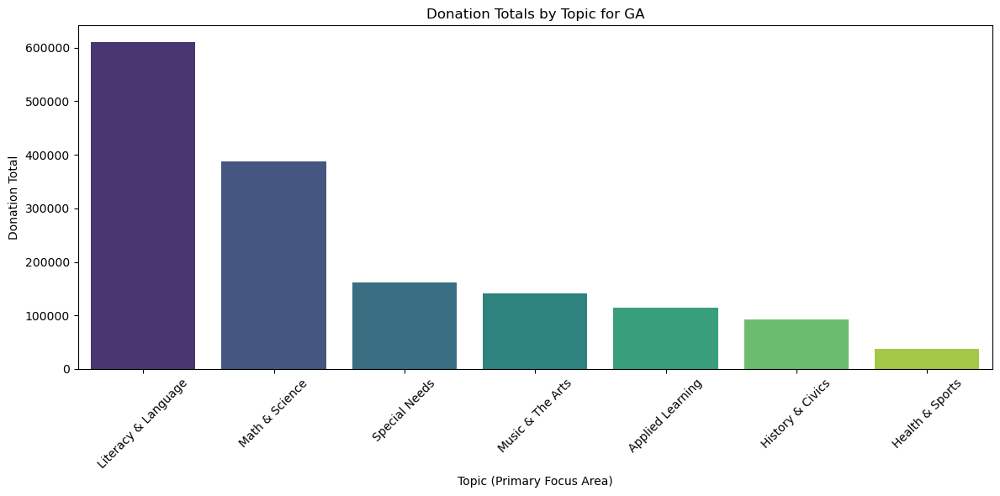

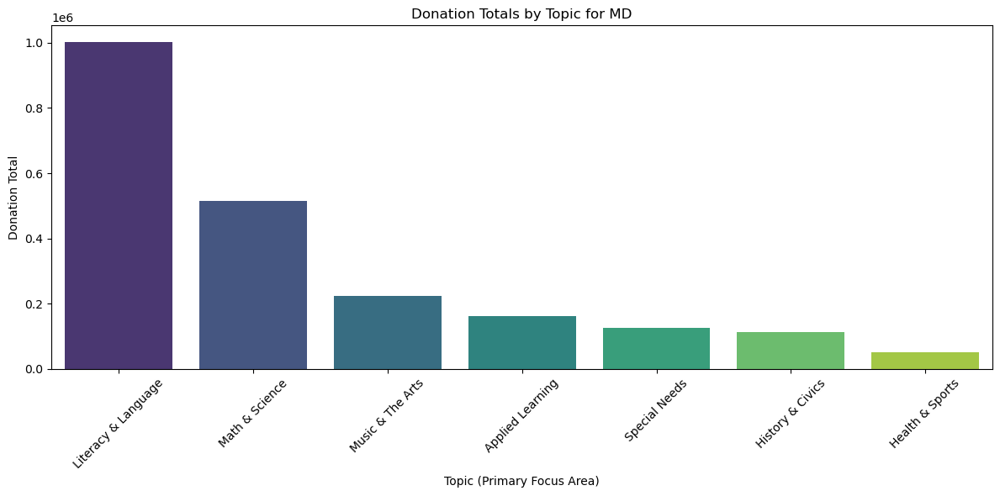

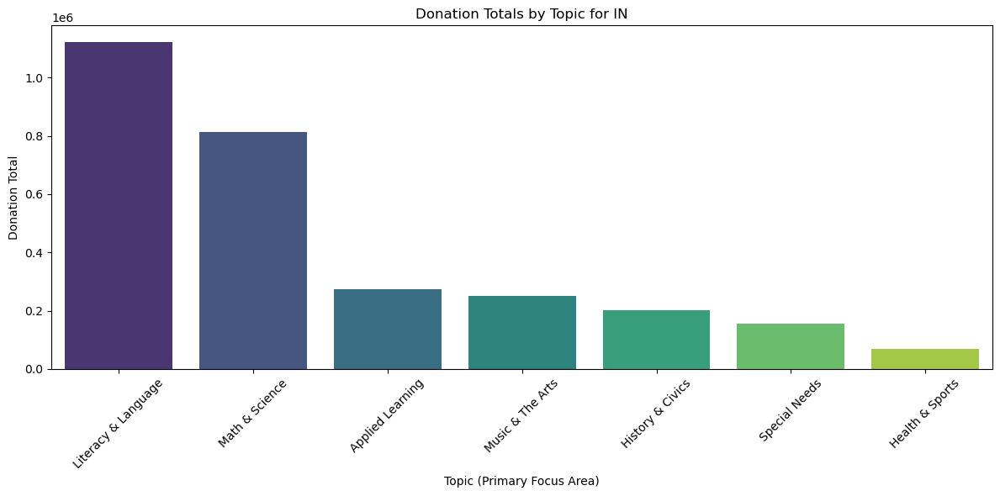

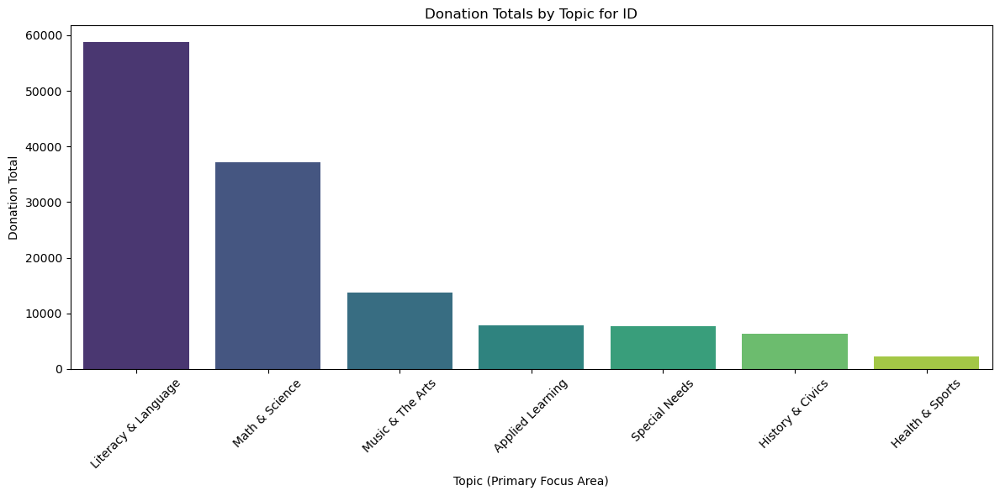

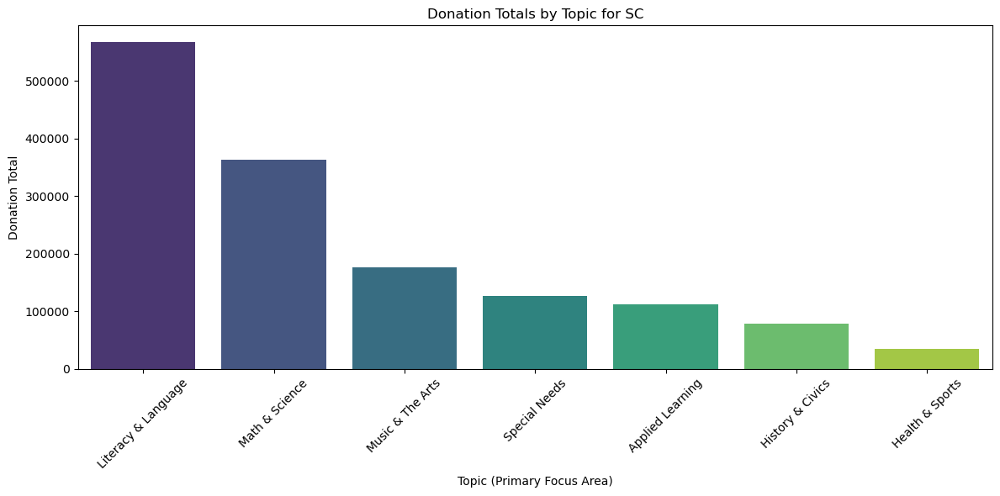

...

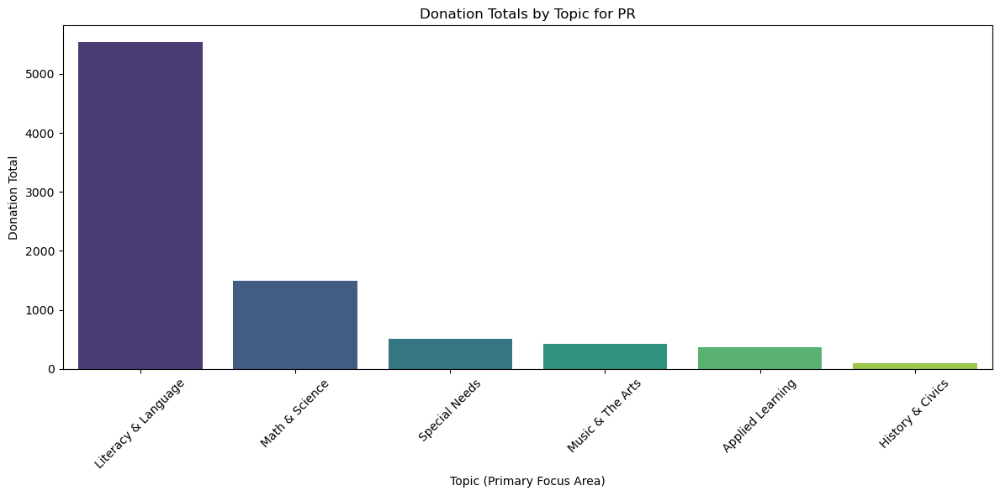

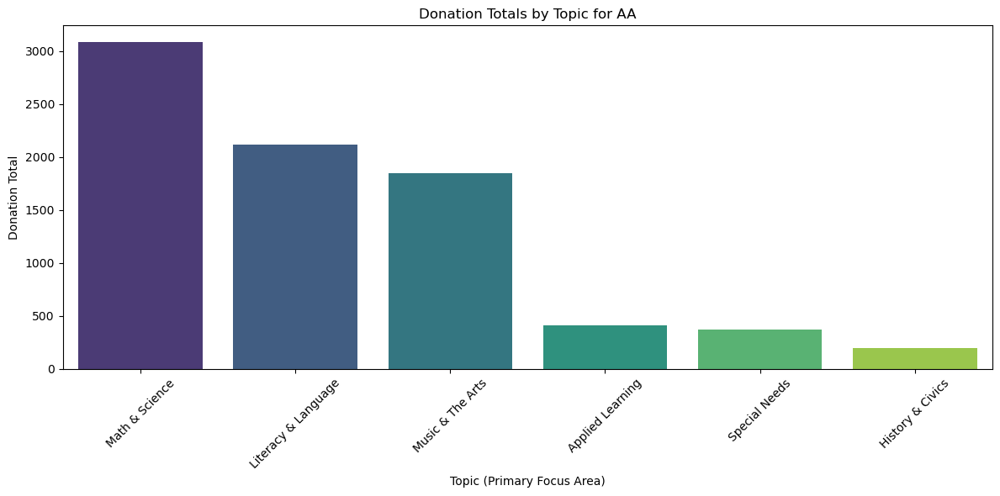

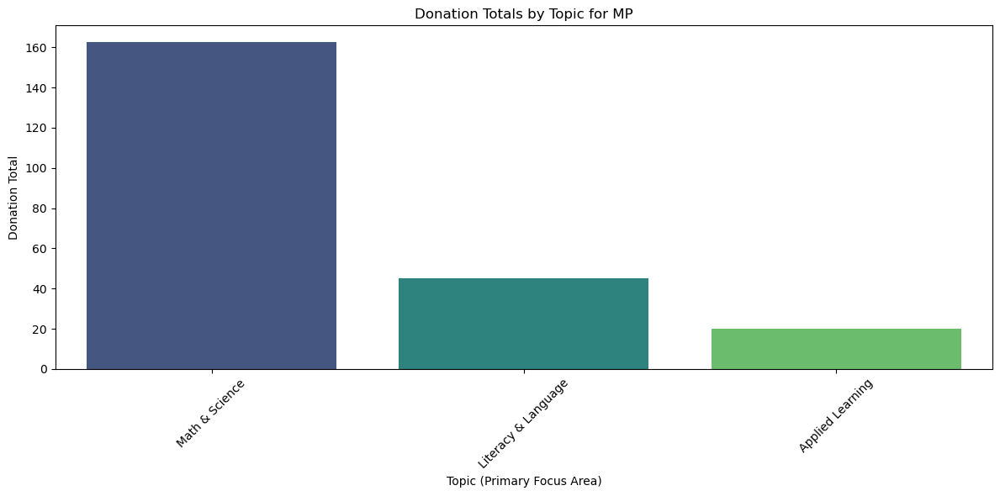

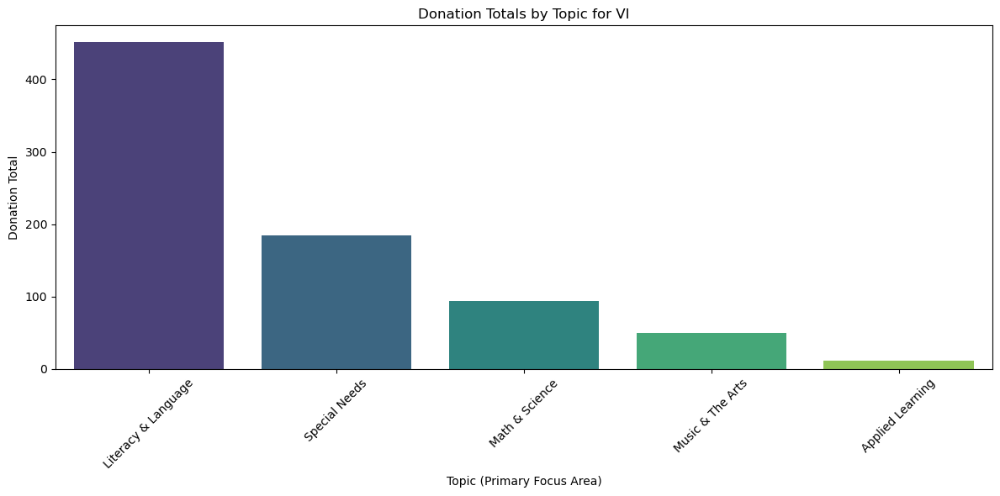

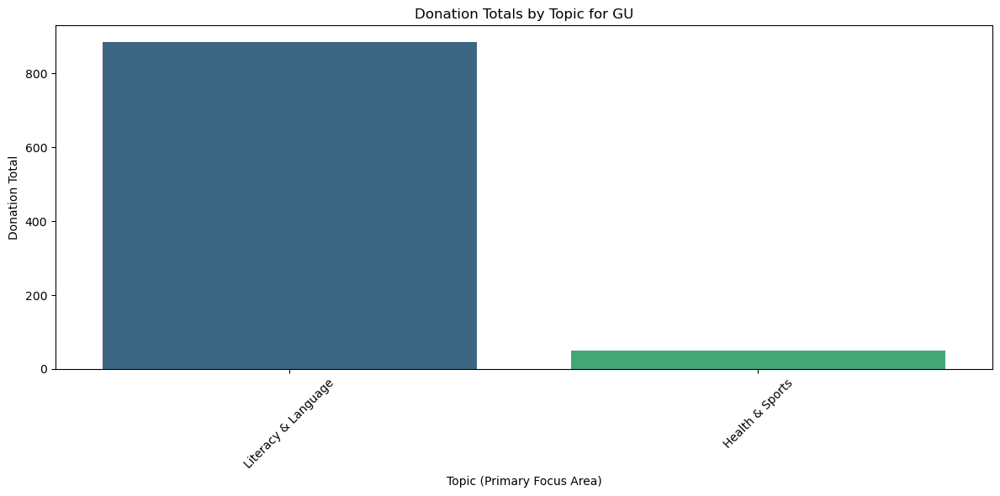

c:\Users\shambhavi\anaconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



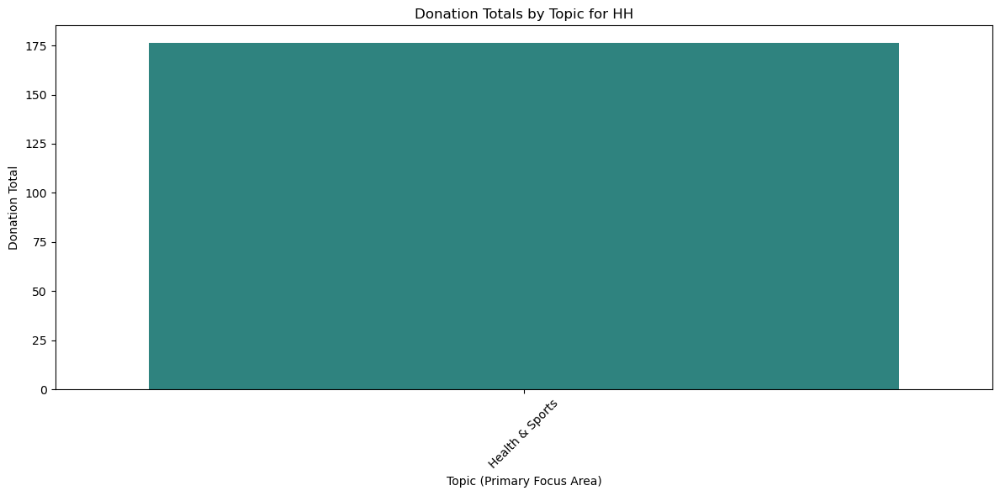

In [40]:
# Get unique states
states = merged['donor_state'].unique()

# Loop through each state
for state in states:
    # Filter data for the current state
    state_data = merged[merged['donor_state'] == state]
    
    # Group by primary focus area (topic) and sum the donation totals
    donations_by_topic = state_data.groupby('primary_focus_area')['donation_total'].sum().reset_index()
    
    # Sort donations for better visualization
    donations_by_topic = donations_by_topic.sort_values(by='donation_total', ascending=False)
    
    # Create the bar plot for the current state
    plt.figure(figsize=(12, 6))
    sns.barplot(x='primary_focus_area', y='donation_total', data=donations_by_topic, palette='viridis')
    plt.title(f"Donation Totals by Topic for {state}")
    plt.xticks(rotation=45)
    plt.xlabel('Topic (Primary Focus Area)')
    plt.ylabel('Donation Total')
    plt.tight_layout()
    
    # Show the plot
    plt.show()

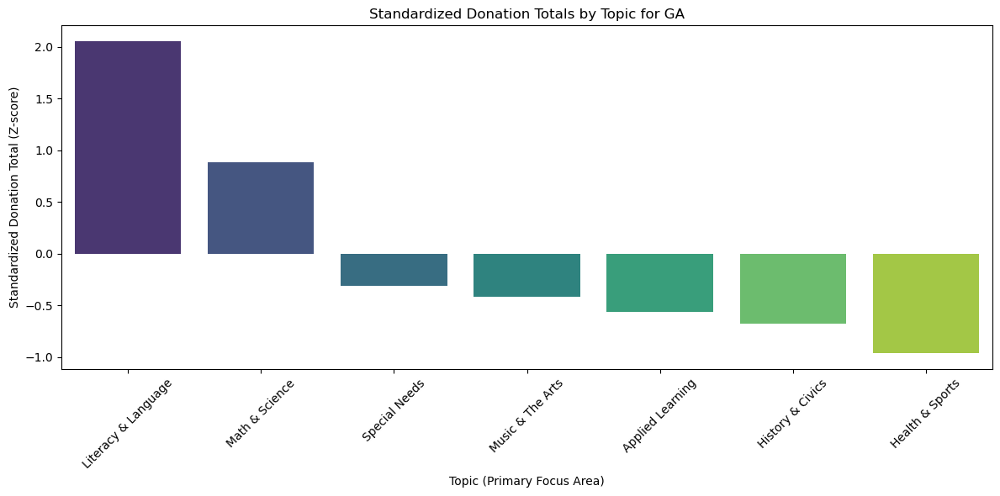

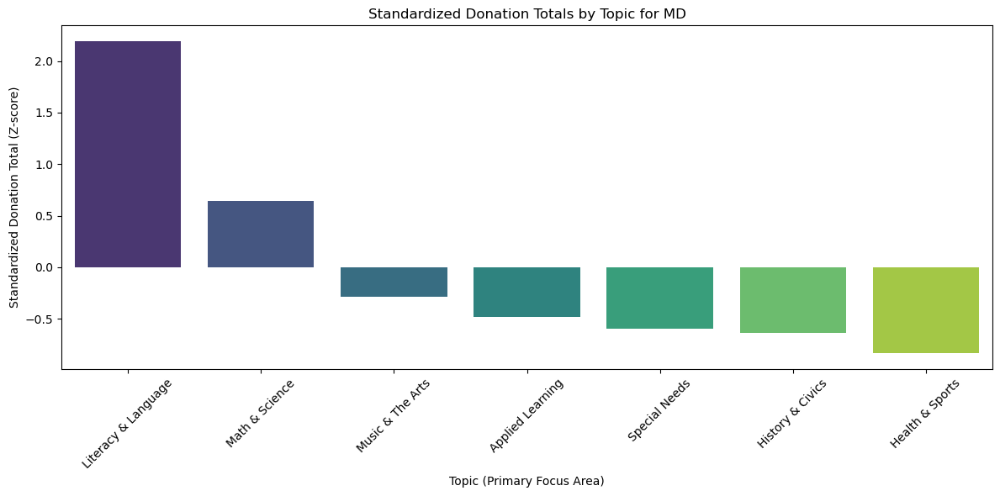

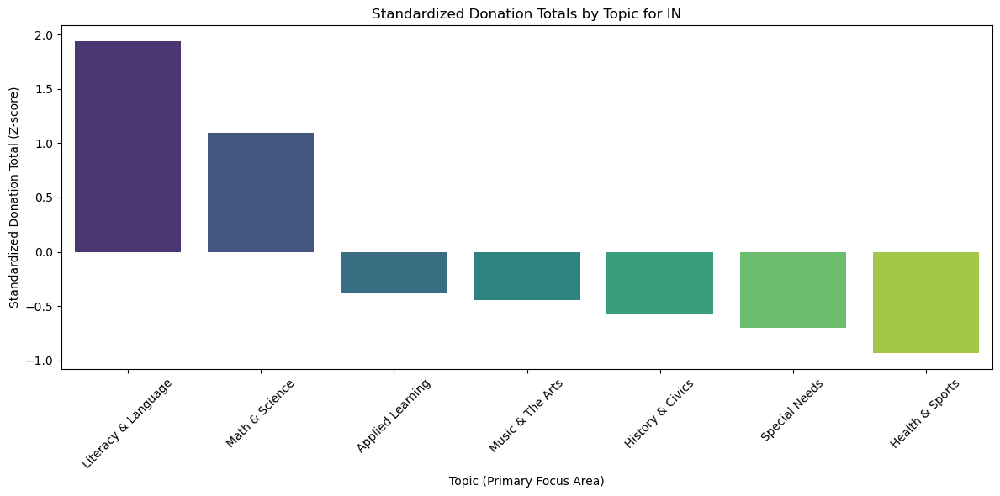

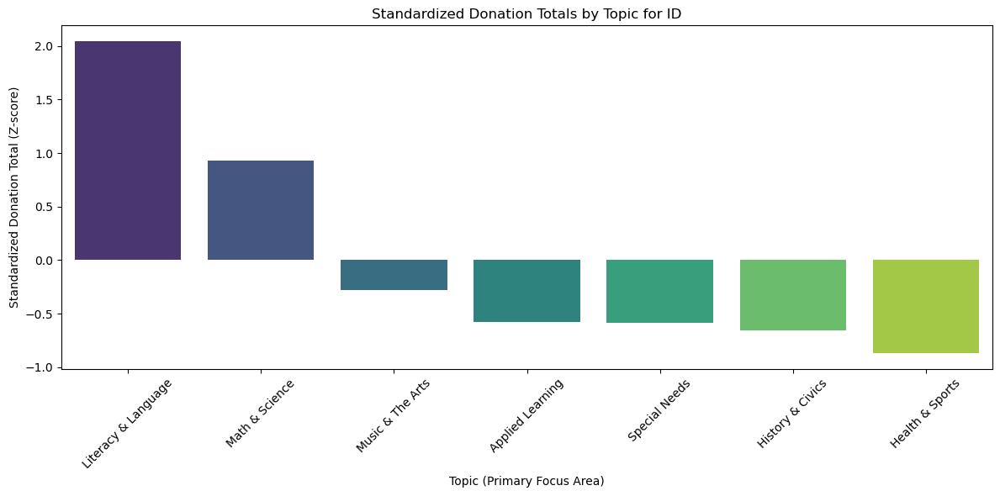

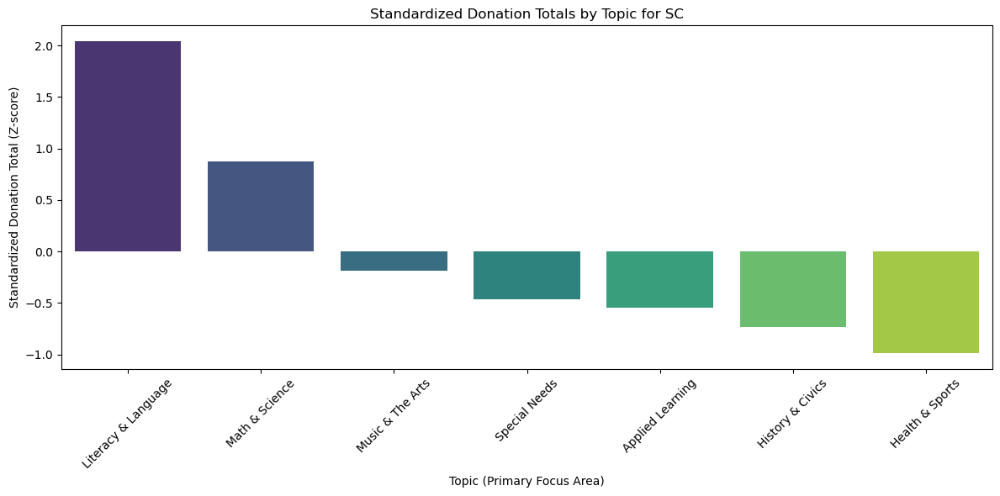

...

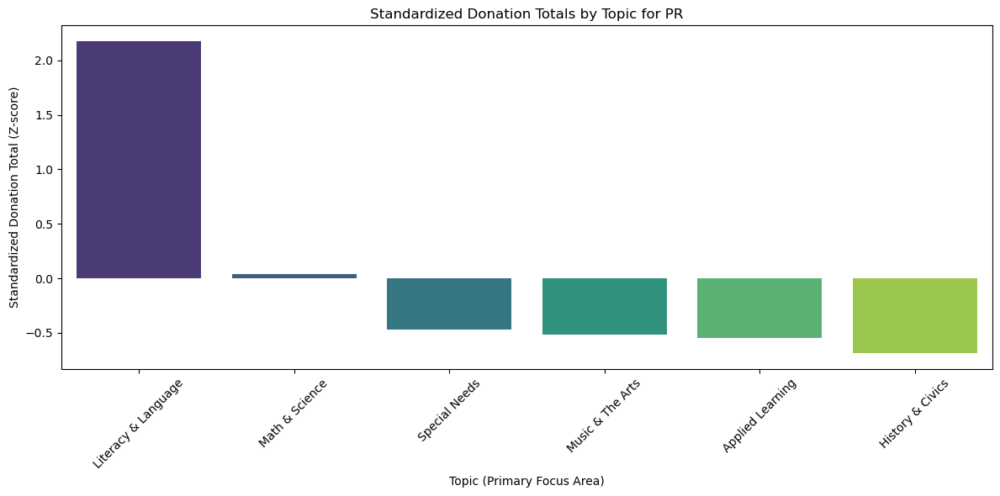

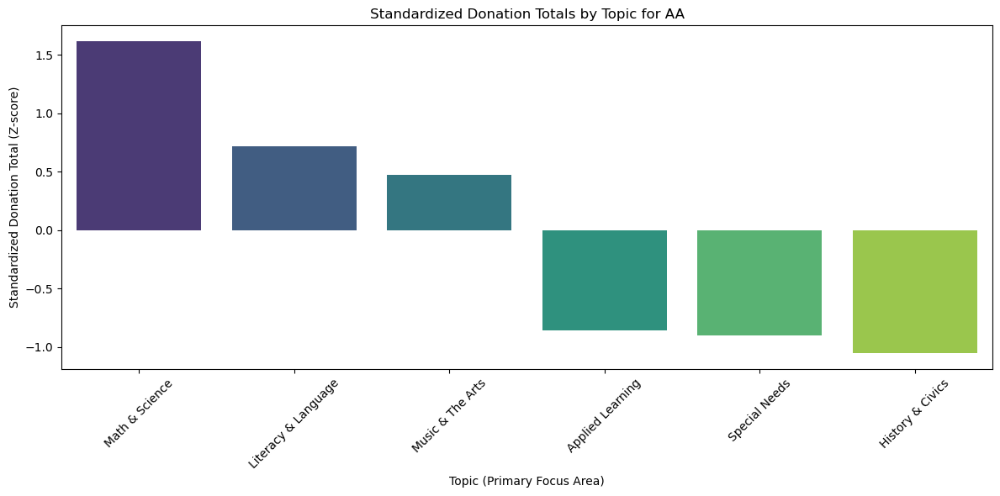

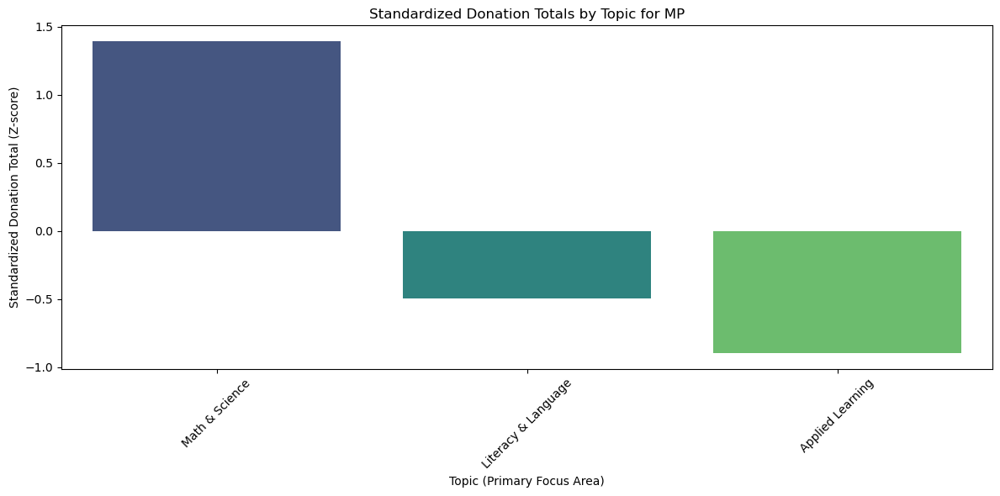

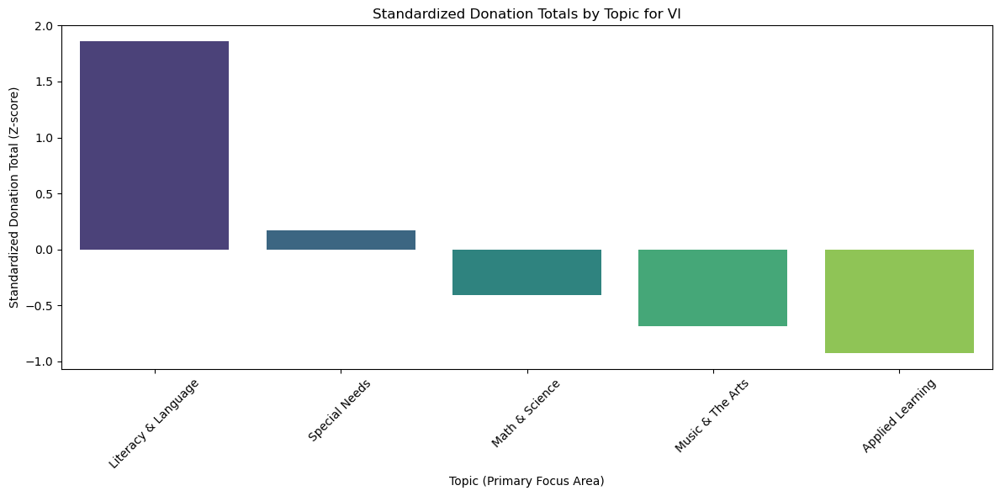

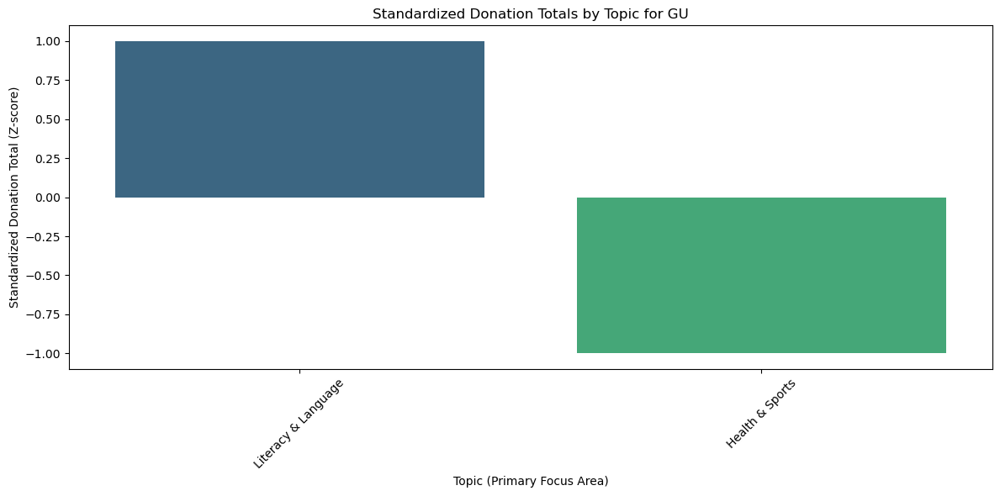

c:\Users\shambhavi\anaconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



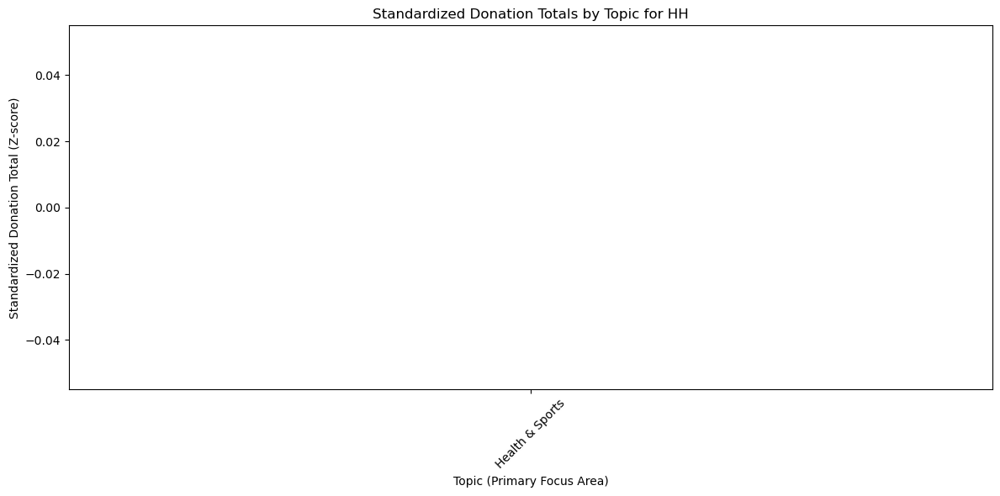

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Get unique states
states = merged['donor_state'].unique()

# Loop through each state
for state in states:
    # Filter data for the current state
    state_data = merged[merged['donor_state'] == state]
    
    # Group by primary focus area (topic) and sum the donation totals
    donations_by_topic = state_data.groupby('primary_focus_area')['donation_total'].sum().reset_index()
    
    # Standardize donation totals using z-score
    donations_by_topic['standardized_donation_total'] = zscore(donations_by_topic['donation_total'])
    
    # Sort donations for better visualization
    donations_by_topic = donations_by_topic.sort_values(by='standardized_donation_total', ascending=False)
    
    # Create the bar plot for the current state
    plt.figure(figsize=(12, 6))
    sns.barplot(x='primary_focus_area', y='standardized_donation_total', data=donations_by_topic, palette='viridis')
    plt.title(f"Standardized Donation Totals by Topic for {state}")
    plt.xticks(rotation=45)
    plt.xlabel('Topic (Primary Focus Area)')
    plt.ylabel('Standardized Donation Total (Z-score)')
    plt.tight_layout()
    
    # Show the plot
    plt.show()
